In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.tokenize import word_tokenize

/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# load two csv files into dataframes
review = pd.read_csv('review.csv')
business = pd.read_csv('business.csv')

<h3><strong> Data Preview </strong></h3>

In [3]:
# preview of review tables
review.head()

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,zAkbMQgxlWf12i48MVCGEg,TbYtn_FYvAZ0wVpptZZGRA,Si1LxB3TpMcs-u-lhYzNvQ,1.0,10,9,7,"OK, Watchmaker of Stoneham, MA....since I rece...",2009-02-25 13:33:38
1,_GnalGMRMLt87ErDDQ6cLQ,I1HLeG-WQRyRiraNapDo-g,JZOwGxrg_fg4tdyglqCIWg,2.0,2,2,1,"The only word I can think of is ""BLAH.""\n\nThe...",2009-04-14 14:58:21
2,QqkAcVSPDMyT5ea3HULdAA,0CfS6YQGjo0CbBEmw5C1sQ,gxgSeA9Y9aMHZyiP9R61AQ,5.0,0,0,0,I visited this ER on my birthday of all days a...,2016-05-02 05:06:26
3,05464Pix9dFnyGjEzJj5Sw,UN7lViNm_bk1o_EeMVYfPQ,mYTArbAmnlHeqhvB-UcOjw,5.0,1,0,0,Very pleased to discover that Bufalo Bob's cha...,2011-05-16 15:28:30
4,6yMo66G8vc0TX1hYDvUeVg,yXXDEQ3xUsYfWhYhFq8RcA,7bYE2n75faWu_OjzxD0l0w,4.0,0,0,0,I had one dish = hooked! I went there randomly...,2008-05-08 18:49:22


In [4]:
review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   review_id    200000 non-null  object 
 1   user_id      200000 non-null  object 
 2   business_id  200000 non-null  object 
 3   stars        200000 non-null  float64
 4   useful       200000 non-null  int64  
 5   funny        200000 non-null  int64  
 6   cool         200000 non-null  int64  
 7   text         200000 non-null  object 
 8   date         200000 non-null  object 
dtypes: float64(1), int64(3), object(5)
memory usage: 13.7+ MB


<h5> review table contains 200000 rows with 9 attributes, here we can see that it contains no missing values  </h5>

In [5]:
# preview business table
business.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom,921 Pearl St,Boulder,CO,80302,40.017544,-105.283348,4.0,86,1,"{'RestaurantsTableService': 'True', 'WiFi': ""u...","Gastropubs, Food, Beer Gardens, Restaurants, B...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'..."
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,7000 NE Airport Way,Portland,OR,97218,45.588906,-122.593331,4.0,126,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsAtt...","Salad, Soup, Sandwiches, Delis, Restaurants, C...","{'Monday': '5:0-18:0', 'Tuesday': '5:0-17:0', ..."
2,bvN78flM8NLprQ1a1y5dRg,The Reclaimory,4720 Hawthorne Ave,Portland,OR,97214,45.511907,-122.613693,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Antiques, Fashion, Used, Vintage & Consignment...","{'Thursday': '11:0-18:0', 'Friday': '11:0-18:0..."
3,oaepsyvc0J17qwi8cfrOWg,Great Clips,2566 Enterprise Rd,Orange City,FL,32763,28.914482,-81.295979,3.0,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Beauty & Spas, Hair Salons",NaN
4,PE9uqAjdw0E4-8mjGl3wVA,Crossfit Terminus,1046 Memorial Dr SE,Atlanta,GA,30316,33.747027,-84.353424,4.0,14,1,"{'GoodForKids': 'False', 'BusinessParking': ""{...","Gyms, Active Life, Interval Training Gyms, Fit...","{'Monday': '16:0-19:0', 'Tuesday': '16:0-19:0'..."


In [6]:
business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160585 entries, 0 to 160584
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   160585 non-null  object 
 1   name          160585 non-null  object 
 2   address       153859 non-null  object 
 3   city          160585 non-null  object 
 4   state         160585 non-null  object 
 5   postal_code   160475 non-null  object 
 6   latitude      160585 non-null  float64
 7   longitude     160585 non-null  float64
 8   stars         160585 non-null  float64
 9   review_count  160585 non-null  int64  
 10  is_open       160585 non-null  int64  
 11  attributes    145593 non-null  object 
 12  categories    160470 non-null  object 
 13  hours         133244 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 17.2+ MB


<h5> review table contains 160585 rows with 14 attributes, here we can see that columns like 'address, postal_code, attributes, categories, hours contain missing values  </h5>

<h3> EDA and Data Cleaning </h3>

<h8> Since our primary goal is to perform sentiment analysis, Business table is not our priority focus, therefore we can merge business table to review table on given business_id </h8>

In [7]:
# plot review stars distribution 
X = review['stars'].value_counts()
X = X.sort_index()
X

1.0    24475
2.0    16890
3.0    23691
4.0    50456
5.0    84488
Name: stars, dtype: int64

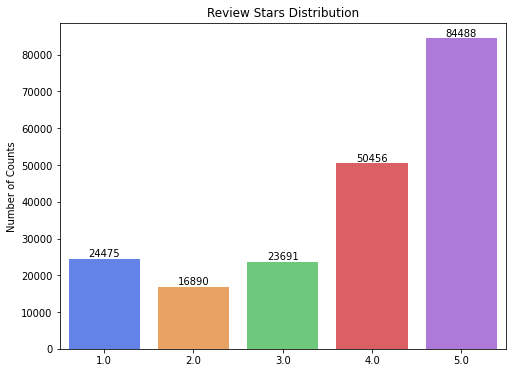

In [8]:
# plot the figure
sns.set_palette("bright")

plt.figure(figsize = (8,6))
ax = sns.barplot(X.index, X.values, alpha = 0.7)
plt.title('Review Stars Distribution')
plt.ylabel('Number of Counts')

# show total count for each bar
rectangle = ax.patches
labels = X.values
for rect, label in zip(rectangle, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha = 'center', va = 'bottom')

In [9]:
# plot business stars distribution 
A = business['stars'].value_counts()
A = A.sort_index()
A

1.0     1686
1.5     4157
2.0     8523
2.5    13720
3.0    21583
3.5    28835
4.0    34056
4.5    28072
5.0    19953
Name: stars, dtype: int64

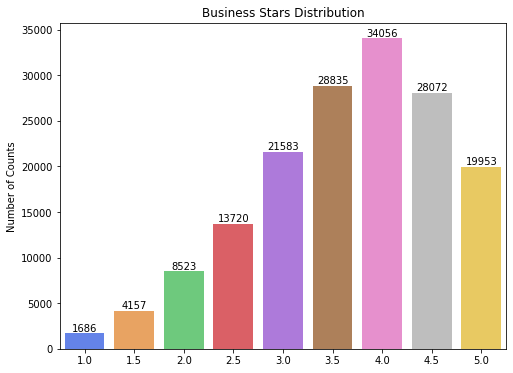

In [10]:
# plot the business rating distribution figure

plt.figure(figsize = (8,6))
ax = sns.barplot(A.index, A.values, alpha = 0.7)
plt.title('Business Stars Distribution')
plt.ylabel('Number of Counts')

# show total count for each bar
rectangle = ax.patches
labels = A.values
for rect, label in zip(rectangle, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha = 'center', va = 'bottom')

In [11]:
# Creating review type based on given stars
print('Positive Review = {}'.format(len(review[review['stars']>3])))
print('Neutral Review = {}'.format(len(review[review['stars']==3])))
print('Negative Review = {}'.format(len(review[review['stars']<3])))

Positive Review = 134944
Neutral Review = 23691
Negative Review = 41365


<h3> 1) Positive Part </h3>

<h4> Top 10 Positive Reviewed Business </h4>

In [12]:
# select the business with stars > 3
top_review_business = review[review['stars'] > 3]
top_review_dictionary = {}

# create a dictionary to store the business_id, and numbers of rated review
for business_id in top_review_business['business_id'].values:
    if business_id in top_review_dictionary:
        top_review_dictionary[business_id] += 1
    else:
        top_review_dictionary[business_id] = 1
        
topbusiness = pd.DataFrame.from_dict(data = top_review_dictionary, orient = 'index')
topbusiness.reset_index(inplace = True)
topbusiness.columns = ['business_id', 'rated']

In [13]:
topbusiness.head(10)

,business_id,rated
0,gxgSeA9Y9aMHZyiP9R61AQ,15
1,mYTArbAmnlHeqhvB-UcOjw,15
2,7bYE2n75faWu_OjzxD0l0w,110
3,oJIcCCUr8KvJ-gR_WifOSg,6
4,D8wLWZiMlw12B2ftoQAm3Q,16
5,84vECQnJg2Us0HJSTmbZLw,8
6,SAo0amnP2FMzLh7eIKhstw,18
7,TAvz8LOfGX8z5FrfvC_ggg,7
8,MYuqzv-jQLBUP0vIppAkGw,48
9,90XZXjKo4ol0BqyOBQoJ8g,21


In [14]:
# create a subtable from business dataframe
business_sub = business[['business_id', 'name', 'categories']]
business_sub

,business_id,name,categories
0,6iYb2HFDywm3zjuRg0shjw,Oskar Blues Taproom,"Gastropubs, Food, Beer Gardens, Restaurants, B..."
1,tCbdrRPZA0oiIYSmHG3J0w,Flying Elephants at PDX,"Salad, Soup, Sandwiches, Delis, Restaurants, C..."
2,bvN78flM8NLprQ1a1y5dRg,The Reclaimory,"Antiques, Fashion, Used, Vintage & Consignment..."
3,oaepsyvc0J17qwi8cfrOWg,Great Clips,"Beauty & Spas, Hair Salons"
4,PE9uqAjdw0E4-8mjGl3wVA,Crossfit Terminus,"Gyms, Active Life, Interval Training Gyms, Fit..."
...,...,...,...
160580,D2mHoIDXx9N8mS1pGoKV9Q,Eleven Oaks Realty,"Real Estate, Real Estate Services, Home Servic..."
160581,bQX-kwVTyZgcdZGEPzce6Q,Webb's Honey,"Health Markets, Food, Specialty Food, Grocery"
160582,wvFZ06nmPmQ2-IVoPqVYLA,Painting with a Twist,"Arts & Entertainment, Paint & Sip, Art Classes..."
160583,GB75wPibj3IjNauaoCxyGA,Havana Cafe,"Cuban, Sandwiches, Restaurants, Cafes"


In [15]:
top_business_data = pd.merge(topbusiness, right = business_sub, how = 'inner', on = 'business_id')
top_business_data

,business_id,rated,name,categories
0,gxgSeA9Y9aMHZyiP9R61AQ,15,Five Star ER,"Emergency Rooms, Health & Medical, Diagnostic ..."
1,mYTArbAmnlHeqhvB-UcOjw,15,Bufalo Bob's Chalupa Wagon,"Tex-Mex, Local Flavor, Specialty Food, Food St..."
2,7bYE2n75faWu_OjzxD0l0w,110,Emma's,"Pizza, Restaurants"
3,oJIcCCUr8KvJ-gR_WifOSg,6,Rollies,"Food, Bubble Tea, Ice Cream & Frozen Yogurt"
4,D8wLWZiMlw12B2ftoQAm3Q,16,Three Dollar Cafe,"Nightlife, Sports Bars, Cafes, Beer, Wine & Sp..."
...,...,...,...,...
12067,ct_CuH0qR-YBr6eL-yq7lw,1,Sport Clips Haircuts of Austin - Westlake,"Men's Hair Salons, Barbers, Hair Salons, Beaut..."
12068,rehesN_HAtcASmbjZGIRAw,1,The World Outdoors,"Tours, Active Life, Travel Services, Hiking, H..."
12069,p-vTSBOOCDxcBe3rqvBaTQ,1,Vip Alterations,"Local Services, Sewing & Alterations"
12070,wTo98g6E7iIMYUDvpp7Rng,1,Immersion Health,"Acupuncture, Health & Medical, Naturopathic/Ho..."


<h4>Positive Reviewed Business categories</h4>

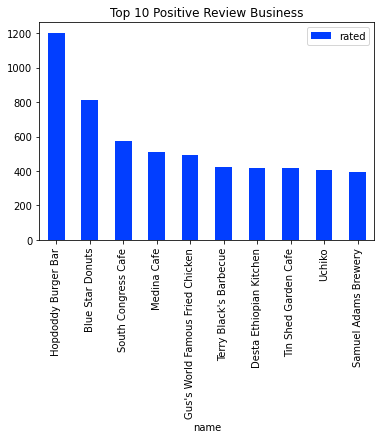

In [16]:
# create a barchart on top 10 postive reviews business:

top_business_data.sort_values('rated')[::-1][:10].plot(x = 'name', y = 'rated', kind = 'bar', title = 'Top 10 Positive Review Business');

In [17]:
# show top 10 business categories among the top 100 business with highest rated
category_data = top_business_data.sort_values('rated')[::-1][:100]
Category = {}

for val in category_data.categories.values:
    val = val.split(',')
    cal = [i.strip() for i in val]
    
    for x in cal:
        if x in Category:
            Category[x] += 1
        else:
            Category[x] = 1
            
top_categories = pd.DataFrame.from_dict(data = Category, orient = 'index')
top_categories.reset_index(inplace = True)
top_categories.columns = ['business category', 'count']

In [18]:
# print(Category)

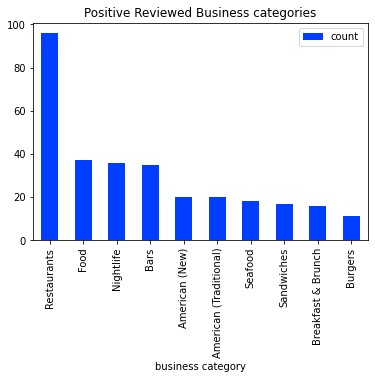

In [19]:
top_categories.sort_values('count')[::-1][:10].plot(x = 'business category', y = 'count', kind = 'bar', title = 'Positive Reviewed Business categories');

<h4> Restaurant being the most frequent business type of our dataset </h4>

<h3> 2) Neutral Part </h3>

In [20]:
# Select data with review stars equal to 3
Neu_review_business = review[review['stars'] == 3]
Neu_review_dictionary = {}

# create a dictionary to store the business_id, and numbers of rated review
for business_id in Neu_review_business['business_id'].values:
    if business_id in Neu_review_dictionary:
        Neu_review_dictionary[business_id] += 1
    else:
        Neu_review_dictionary[business_id] = 1
        
Neubusiness = pd.DataFrame.from_dict(data = Neu_review_dictionary, orient = 'index')
Neubusiness.reset_index(inplace = True)
Neubusiness.columns = ['business_id', 'rated']
Neubusiness

,business_id,rated
0,viTut7TZzcR2Q8HAtqe8Zw,4
1,RJfovzPhmdt-pYHnFboM8w,15
2,J1uidHIL7nE_noUuvFXj0A,28
3,jGennaZUr2MsJyRhijNBfA,22
4,w3HSOOqJednBOYbO3fajvQ,14
...,...,...
5387,gtT-wTqDvMnO123gU5Uk5Q,1
5388,H_dmWPNW3T_yJI_w582Ygw,1
5389,uquyiSrVAKTbMDIdocKUgA,1
5390,aM7kKueLeGOHIM3LA05Btw,1


In [21]:
# Merge two table
Neu_business_data = pd.merge(Neubusiness, right = business_sub, how = 'inner', on = 'business_id')
Neu_business_data

,business_id,rated,name,categories
0,viTut7TZzcR2Q8HAtqe8Zw,4,Tim Hortons,"Coffee & Tea, Bakeries, Food, Fast Food, Resta..."
1,RJfovzPhmdt-pYHnFboM8w,15,The Avenue,"Beer Bar, Sandwiches, Nightlife, Restaurants, ..."
2,J1uidHIL7nE_noUuvFXj0A,28,Grotto,"Restaurants, Italian"
3,jGennaZUr2MsJyRhijNBfA,22,Legal Sea Foods,"Sandwiches, Food, Restaurants, Breakfast & Bru..."
4,w3HSOOqJednBOYbO3fajvQ,14,Les Faux Bourgeois,"Restaurants, French, Cafes"
...,...,...,...,...
5387,gtT-wTqDvMnO123gU5Uk5Q,1,Ferrara Pizza and Pasta,"Pizza, Italian, Restaurants, Breakfast & Brunch"
5388,H_dmWPNW3T_yJI_w582Ygw,1,Deli Nippon,"Japanese, Restaurants"
5389,uquyiSrVAKTbMDIdocKUgA,1,Subway,"Restaurants, Fast Food, Sandwiches"
5390,aM7kKueLeGOHIM3LA05Btw,1,IHOP,"Restaurants, Breakfast & Brunch, Pancakes"


<h4>Neutral Reviewed Business categories</h4>

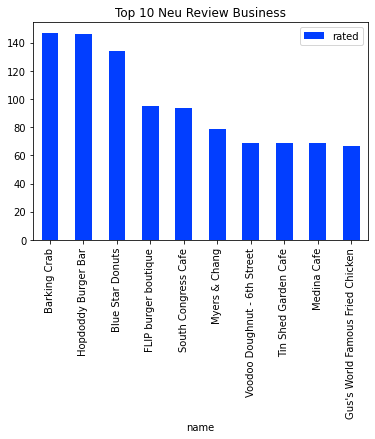

In [22]:
Neu_business_data.sort_values('rated')[::-1][:10].plot(x = 'name', y = 'rated', kind = 'bar', title = 'Top 10 Neu Review Business');

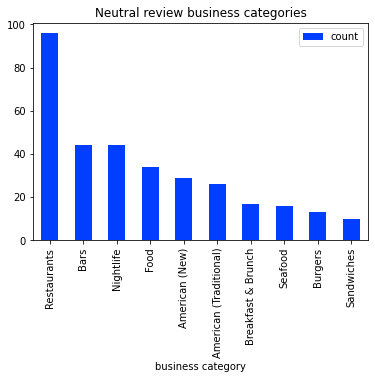

In [23]:
# getting the category info and store to a dictionary called Category
category_data = Neu_business_data.sort_values('rated')[::-1][:100]
Category = {}

for val in category_data.categories.values:
    val = val.split(',')
    cal = [i.strip() for i in val]
    
    for x in cal:
        if x in Category:
            Category[x] += 1
        else:
            Category[x] = 1
            
Neu_categories = pd.DataFrame.from_dict(data = Category, orient = 'index')
Neu_categories.reset_index(inplace = True)
Neu_categories.columns = ['business category', 'count']     
Neu_categories.sort_values('count')[::-1][:10].plot(x = 'business category', y = 'count', kind = 'bar', title = 'Neutral review business categories');

<h4> Restaurant being the most frequent business type of neutral review </h4>

<h3> 3) Negative Part </h3>

In [24]:
# select those business with less than 3 stars
Negative_review_business = review[review['stars'] < 3]
Negative_review_dictionary = {}

# create a dictionary to store the business_id, and numbers of rated review
for business_id in Negative_review_business['business_id'].values:
    if business_id in Negative_review_dictionary:
        Negative_review_dictionary[business_id] += 1
    else:
        Negative_review_dictionary[business_id] = 1
        
Negabusiness = pd.DataFrame.from_dict(data = Negative_review_dictionary, orient = 'index')
Negabusiness.reset_index(inplace = True)
Negabusiness.columns = ['business_id', 'rated']
Negabusiness

,business_id,rated
0,Si1LxB3TpMcs-u-lhYzNvQ,2
1,JZOwGxrg_fg4tdyglqCIWg,20
2,SwafLjsIK8X4F6md2n6PRw,14
3,MjpH-uP90jTUp_KqAOiBJg,32
4,YcSX5CXe5z2Z0WfIVJnwPQ,2
...,...,...
7960,mtaWCuZ6_-jn4ISpKrhrMQ,1
7961,P2oqV71cwsi-GqFnxEKJqg,1
7962,m09uTu0Wcl7znogV2TAzvQ,1
7963,bQZDuK2jPf6XWrkiJe8z6g,1


In [25]:
# Merge two table
Nega_business_data = pd.merge(Negabusiness, right = business_sub, how = 'inner', on = 'business_id')
Nega_business_data

,business_id,rated,name,categories
0,Si1LxB3TpMcs-u-lhYzNvQ,2,The Watchmaker,"Shopping, Watch Repair, Watches, Local Services"
1,JZOwGxrg_fg4tdyglqCIWg,20,Blue Fin,"Sushi Bars, Restaurants, Japanese, Izakaya"
2,SwafLjsIK8X4F6md2n6PRw,14,Waldorf Astoria,"Restaurants, Breakfast & Brunch, Hotels & Trav..."
3,MjpH-uP90jTUp_KqAOiBJg,32,Stella,"Bars, Wine Bars, Food, Restaurants, Vegetarian..."
4,YcSX5CXe5z2Z0WfIVJnwPQ,2,Minico's,"Restaurants, Event Planning & Services, Party ..."
...,...,...,...,...
7960,mtaWCuZ6_-jn4ISpKrhrMQ,1,Wild Child,"Shoe Stores, Shopping, Baby Gear & Furniture, ..."
7961,P2oqV71cwsi-GqFnxEKJqg,1,Costelos Restaurant,"Restaurants, Food, Latin American"
7962,m09uTu0Wcl7znogV2TAzvQ,1,Amber Inn & Suites,"Event Planning & Services, Hotels, Hotels & Tr..."
7963,bQZDuK2jPf6XWrkiJe8z6g,1,Winfrey's Fudge and Chocolates,"Specialty Food, Food, Chocolatiers & Shops, Ca..."


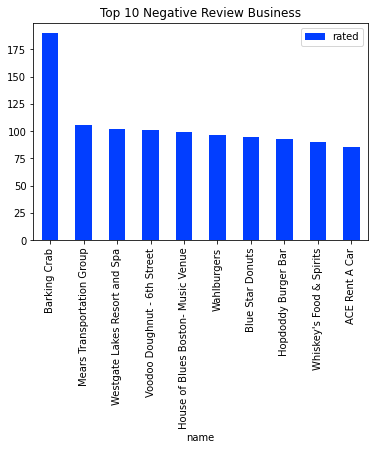

In [26]:

Nega_business_data.sort_values('rated')[::-1][:10].plot(x = 'name', y = 'rated', kind = 'bar', title = 'Top 10 Negative Review Business');

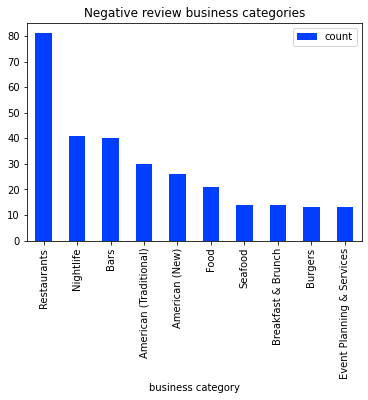

In [27]:
category_data = Nega_business_data.sort_values('rated')[::-1][:100]
Category = {}

for val in category_data.categories.values:
    val = val.split(',')
    cal = [i.strip() for i in val]
    
    for x in cal:
        if x in Category:
            Category[x] += 1
        else:
            Category[x] = 1
            
Nega_categories = pd.DataFrame.from_dict(data = Category, orient = 'index')
Nega_categories.reset_index(inplace = True)
Nega_categories.columns = ['business category', 'count']     
Nega_categories.sort_values('count')[::-1][:10].plot(x = 'business category', y = 'count', kind = 'bar', title = 'Negative review business categories');

<h2> WordCloud </h2>

<strong></h4> Text Preprocessing </h4></strong>

In [28]:
# loading the required libraries
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords

import re
import string
import nltk

In [29]:
# Create a columns with categorical values 'Positive, Neutral, Negative'
# initial the target columns with all 0 
review['mood'] = 0

conditions = [
    (review['stars'] < 3), # if stars less than 3, we then identify it as negative review
    (review['stars'] == 3), # if stars equal to 3, we then identify it as neutral review
    (review['stars'] > 3) # if stars greater than 3, we then identigy it as positive review
]

# create a list of the values we want to assign for each condition
values = [-1, 0, 1]

# assign values to the target columns based on conditions
review['mood'] = np.select(conditions, values)

review.head(10)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date,mood
0,zAkbMQgxlWf12i48MVCGEg,TbYtn_FYvAZ0wVpptZZGRA,Si1LxB3TpMcs-u-lhYzNvQ,1.0,10,9,7,"OK, Watchmaker of Stoneham, MA....since I rece...",2009-02-25 13:33:38,-1
1,_GnalGMRMLt87ErDDQ6cLQ,I1HLeG-WQRyRiraNapDo-g,JZOwGxrg_fg4tdyglqCIWg,2.0,2,2,1,"The only word I can think of is ""BLAH.""\n\nThe...",2009-04-14 14:58:21,-1
2,QqkAcVSPDMyT5ea3HULdAA,0CfS6YQGjo0CbBEmw5C1sQ,gxgSeA9Y9aMHZyiP9R61AQ,5.0,0,0,0,I visited this ER on my birthday of all days a...,2016-05-02 05:06:26,1
3,05464Pix9dFnyGjEzJj5Sw,UN7lViNm_bk1o_EeMVYfPQ,mYTArbAmnlHeqhvB-UcOjw,5.0,1,0,0,Very pleased to discover that Bufalo Bob's cha...,2011-05-16 15:28:30,1
4,6yMo66G8vc0TX1hYDvUeVg,yXXDEQ3xUsYfWhYhFq8RcA,7bYE2n75faWu_OjzxD0l0w,4.0,0,0,0,I had one dish = hooked! I went there randomly...,2008-05-08 18:49:22,1
5,XaNpsnPoksICe_mjnkt_rA,bqMpZz_enbBfnEy7P4dkKQ,SwafLjsIK8X4F6md2n6PRw,2.0,1,0,0,What a difference a third visit makes. And not...,2016-03-14 07:43:46,-1
6,Cnj5_Xl4iLHQhAygxnWiNg,GETsANzAWIjsgkcmLs2sAQ,MjpH-uP90jTUp_KqAOiBJg,1.0,0,0,0,I was so excited to take my sisters to this re...,2008-12-23 15:55:59,-1
7,wDfj4SGYg579KtGizbeNLg,RH3_ufCheArGjKQAMTGSyg,oJIcCCUr8KvJ-gR_WifOSg,4.0,0,0,0,On a mission to try the ice cream options in W...,2018-06-19 00:47:29,1
8,FOgjpt8m_yl49an68wo5mw,q5eGkrVpUrGNZ_0Pt8zPXQ,D8wLWZiMlw12B2ftoQAm3Q,4.0,0,0,0,Best blackened grouper sandwich I have ever ha...,2017-01-20 06:02:42,1
9,c3L2NqpuQZecEh-XrGn34Q,AChi-qcfH1u3KYGVox9hZw,viTut7TZzcR2Q8HAtqe8Zw,3.0,0,0,0,Got the maple donut. I was impressed by the fl...,2017-11-12 22:44:40,0


In [30]:
# collecting textual data from dataset:
pos = review[review['mood'] == 1]['text']
neu = review[review['mood'] == 0]['text']
neg = review[review['mood'] == -1]['text']

In [31]:
nltk.download('punkt')
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to /Users/henryzou1/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [32]:
# store all textual data into a list
pos = pos.tolist()
neu = neu.tolist()
neg = neg.tolist()

<strong></h3> Positive Review </h3></strong>

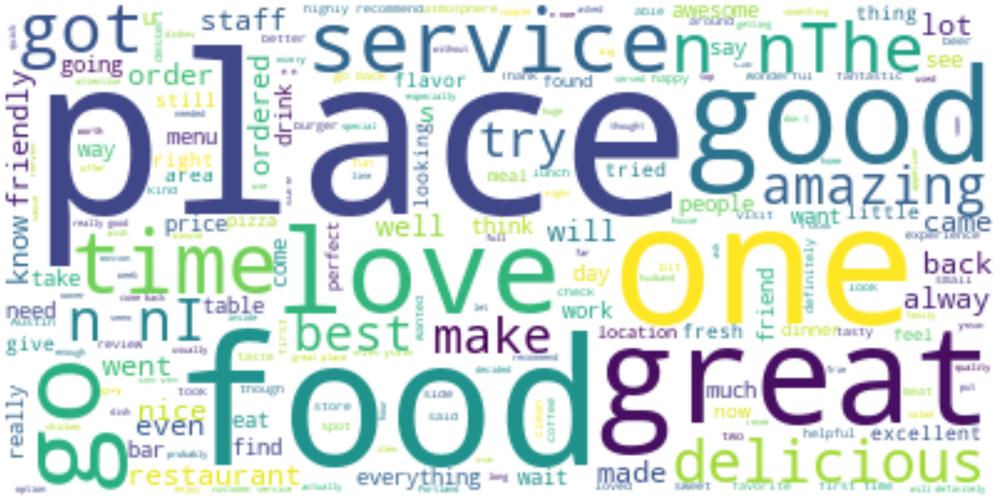

In [33]:
# create a list of stopwords
Mystopwords = set(STOPWORDS)

pos_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(pos))
plt.figure(figsize = (50,20))
plt.imshow(pos_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

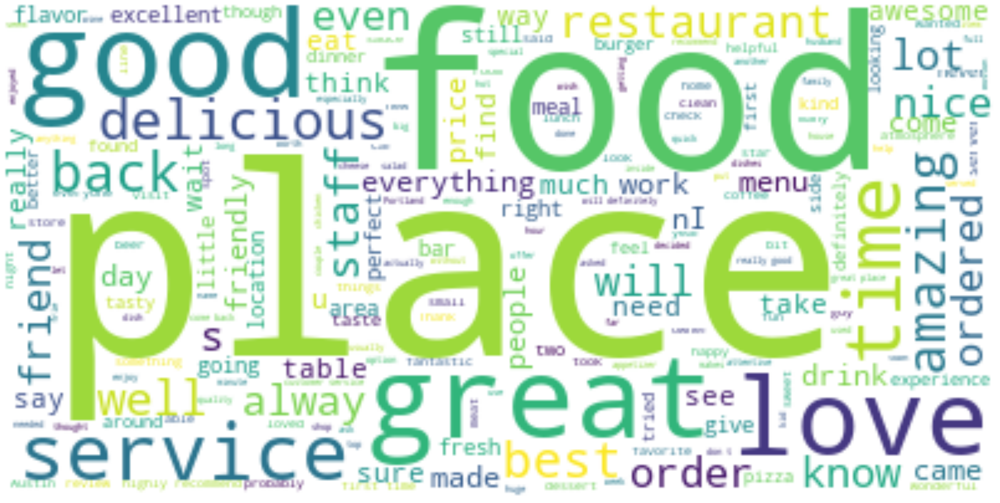

In [34]:
# remove those keywords which didnt makes senses
Mystopwords.update(['now', 'go', 'one', 'make', 'try', 'thing', 'went', 'got', 'want', 'nThe', 'n'])

pos_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(pos))
plt.figure(figsize = (50,20))
plt.imshow(pos_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

<h4> here we can see many positive keywords like "delicious, love, best, good, great, food" </h4>

<strong></h4> Neutral Review </h4></strong>

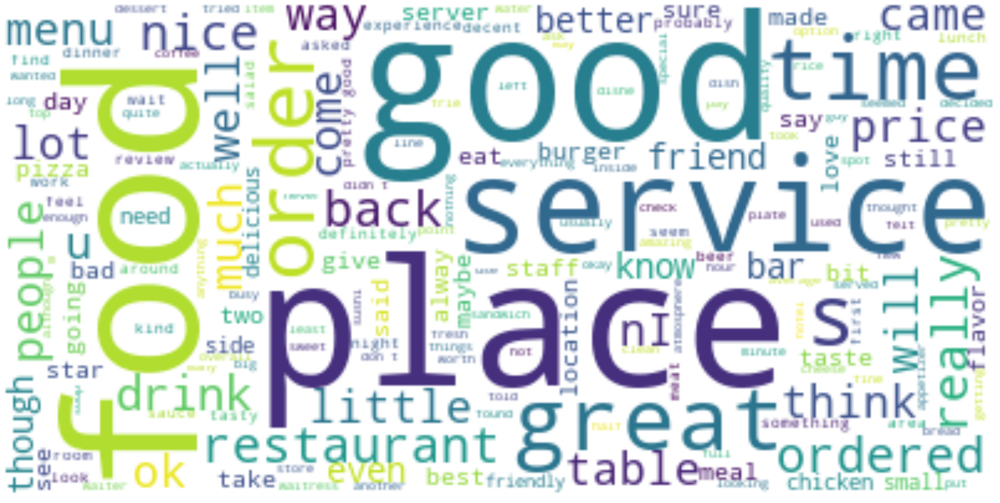

In [35]:
neu_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(neu))
plt.figure(figsize = (50,20))
plt.imshow(neu_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

<strong></h4> Negative Review </h4></strong>

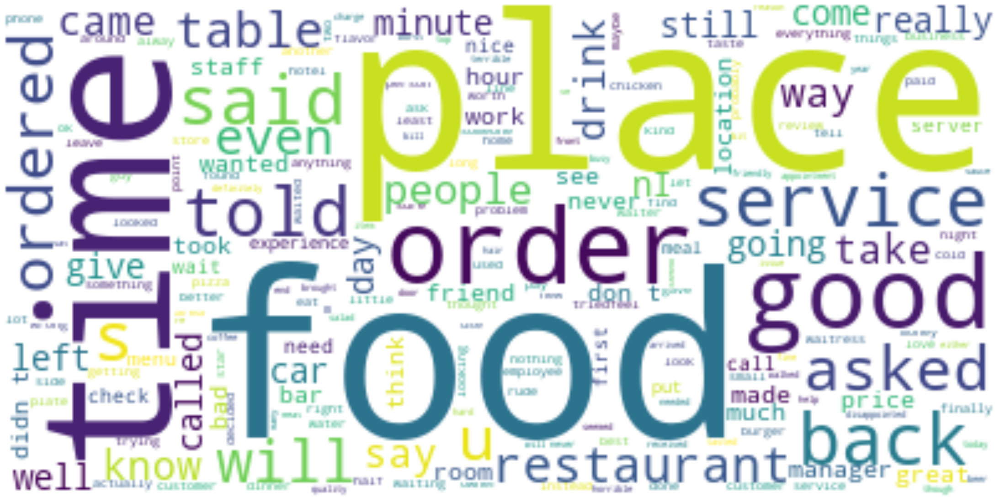

In [36]:
neg_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(neg))
plt.figure(figsize = (50,20))
plt.imshow(neg_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

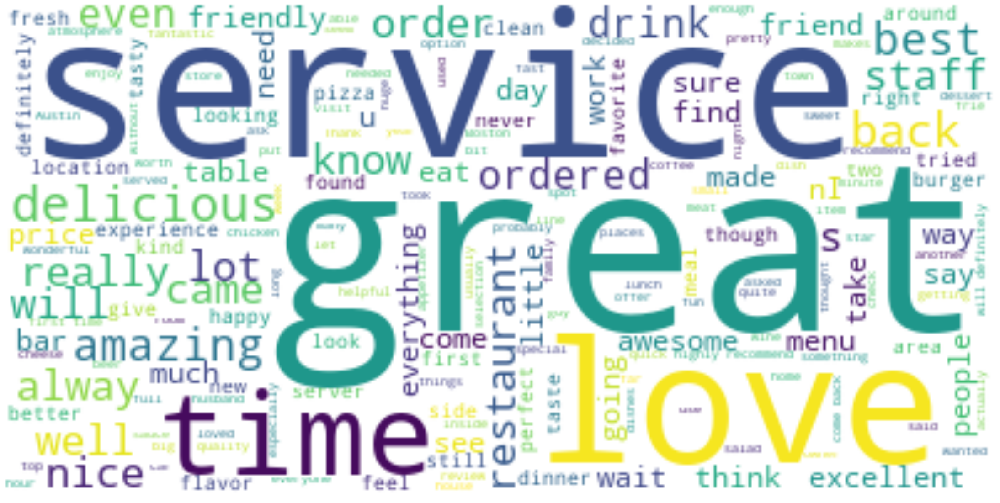

In [37]:
# since 'Place, good, food are overlapping with all three classes, we decide to exclude these keywords'
Mystopwords.update(['good','food','place'])

pos_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(pos))
plt.figure(figsize = (50,20))
plt.imshow(pos_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

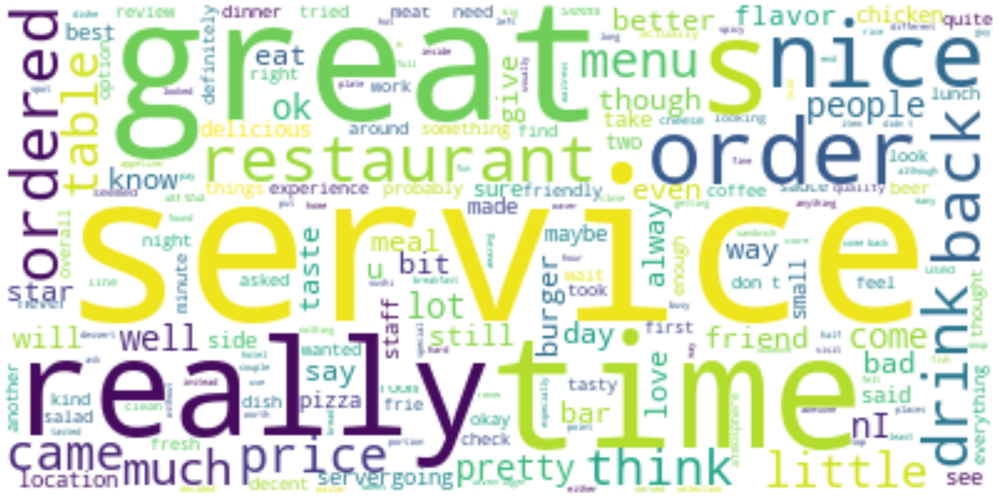

In [38]:
neu_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(neu))
plt.figure(figsize = (50,20))
plt.imshow(neu_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()


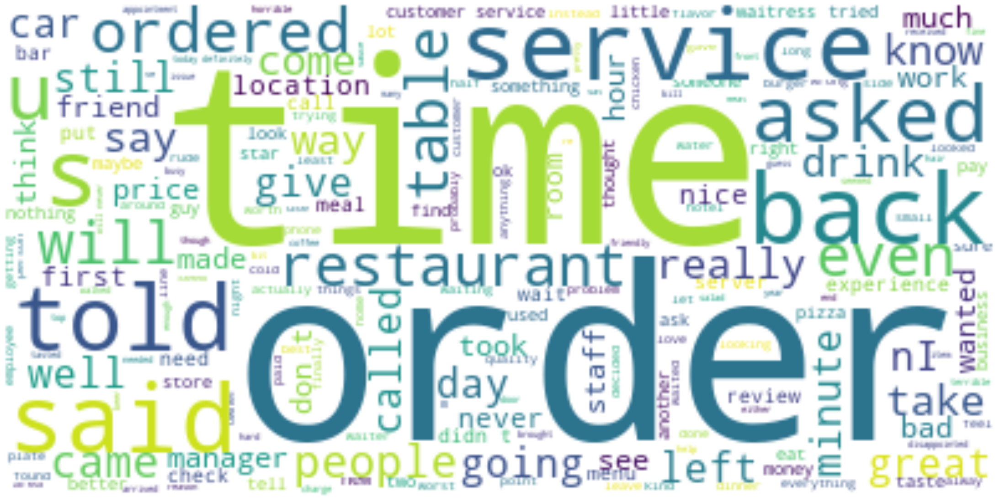

In [39]:
neg_wc = WordCloud(stopwords = Mystopwords, background_color= 'white', max_words = 200).generate(str(neg))
plt.figure(figsize = (50,20))
plt.imshow(neg_wc, interpolation = 'bilinear')
plt.axis('off')
plt.show()

<h2> NLP Predictor </h2>

<h4> text cleaning </h4>

In [40]:
# process text cleaning
def text_cleaning(text):
    text = re.sub(r'http\S+', ' ', text) # remove all URL link
    text = re.sub('@[^\s]*', ' ', text) # remove all mention sign @
    text = re.sub('#[^\s]*', ' ', text) # remove all hashtage
    text = re.sub('[0-9]*[+-:]*[0-9]+', ' ', text) # remove numbers
    text = re.sub("'s", ' ', text) # remove 's
    return text

In [41]:
# applying cleaning function to our textual data
review['text'] = review['text'].apply(lambda text: text_cleaning(text))

In [42]:
# preview the text column
review['text']

0         OK, Watchmaker of Stoneham, MA....since I rece...
1         The only word I can think of is "BLAH."\n\nThe...
2         I visited this ER on my birthday of all days a...
3         Very pleased to discover that Bufalo Bob  chal...
4         I had one dish = hooked! I went there randomly...
                                ...                        
199995    After   nights of chain restaurants, I needed ...
199996    Booked a private party and supposedly all incl...
199997    If it was possible to give less than one star ...
199998    Visited PCM and wanted something sweet. That p...
199999    yum - this is exactly what you expect when you...
Name: text, Length: 200000, dtype: object

In [43]:
# create stopwords list
English_stop_words = set(stopwords.words('english'))

# define text process function
def text_process(junk):
    '''
    step 1: remove puncutations
    step 2: remove stop words which have no meaning
    step 3: return the list
    '''
    nopunc = [ch for ch in junk if ch not in string.punctuation]
    nopunc = ''.join(nopunc)
    return [word for word in nopunc.split() if word.lower() not in English_stop_words]

In [44]:
review['text'].apply(text_process)
review['text']

0         OK, Watchmaker of Stoneham, MA....since I rece...
1         The only word I can think of is "BLAH."\n\nThe...
2         I visited this ER on my birthday of all days a...
3         Very pleased to discover that Bufalo Bob  chal...
4         I had one dish = hooked! I went there randomly...
                                ...                        
199995    After   nights of chain restaurants, I needed ...
199996    Booked a private party and supposedly all incl...
199997    If it was possible to give less than one star ...
199998    Visited PCM and wanted something sweet. That p...
199999    yum - this is exactly what you expect when you...
Name: text, Length: 200000, dtype: object

<h4> Standardize our data and split traning and testing sets </h4>

In [45]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

<h4> resampling data to reduce model complexity since 200000 rows will take forever to run </h4>

In [46]:
# resampling data:
less_data = review.sample(n = 10000, random_state = 45)
less_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 195227 to 71521
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   review_id    10000 non-null  object 
 1   user_id      10000 non-null  object 
 2   business_id  10000 non-null  object 
 3   stars        10000 non-null  float64
 4   useful       10000 non-null  int64  
 5   funny        10000 non-null  int64  
 6   cool         10000 non-null  int64  
 7   text         10000 non-null  object 
 8   date         10000 non-null  object 
 9   mood         10000 non-null  int64  
dtypes: float64(1), int64(4), object(5)
memory usage: 859.4+ KB


In [47]:
X_less = less_data['text']
y_less = less_data['mood']

X_less_train, X_less_test, y_less_train, y_less_test = train_test_split(X_less, y_less, test_size = 0.2, random_state = 45)
print(X_less_train.shape)
print(X_less_test.shape)
print(y_less_train.shape)
print(y_less_test.shape)

(8000,)
(2000,)
(8000,)
(2000,)


<h4> TF_IDF Term Frequency-Inverse Document Frequency to Vectorize our data </h4>

In [48]:
# set tfidf vectorizer2
vec_2 = TfidfVectorizer(analyzer = 'word', stop_words = {'english'}).fit(X_less_train)

# fit data
X_less_train_vec = vec_2.transform(X_less_train)
X_less_test_vec = vec_2.transform(X_less_test)

In [49]:
# check balance for our training set
y_less_train.value_counts()

 1    5430
-1    1627
 0     943
Name: mood, dtype: int64

In [50]:
from imblearn.over_sampling import SMOTE

# apply SMOTE to oversampling due to imbalanced data
sm = SMOTE(random_state = 45)
X_less_balance, y_less_balance = sm.fit_resample(X_less_train_vec, y_less_train)
y_less_balance.value_counts()

-1    5430
 1    5430
 0    5430
Name: mood, dtype: int64

<h2> Models Development </h2>

<h4> Logistic Regression </h4>

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve


lr = LogisticRegression(solver='lbfgs', max_iter=500, random_state = 45)
lr.fit(X_less_balance, y_less_balance)
lr_y = lr.predict(X_less_test_vec)

lr_roc_auc = roc_auc_score(y_less_test, lr.predict_proba(X_less_test_vec), multi_class = 'ovr')

print('The confusion matrix is: ')
print(confusion_matrix(y_less_test, lr_y))

print(classification_report(y_less_test, lr_y))

The confusion matrix is: 
[[ 336   43   39]
 [  66  101   89]
 [  50  113 1163]]
              precision    recall  f1-score   support

          -1       0.74      0.80      0.77       418
           0       0.39      0.39      0.39       256
           1       0.90      0.88      0.89      1326

    accuracy                           0.80      2000
   macro avg       0.68      0.69      0.68      2000
weighted avg       0.80      0.80      0.80      2000



<h4> KNN </h4>

In [56]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV


In [62]:
KNN = KNeighborsClassifier()
KNN.fit(X_less_balance, y_less_balance)
KNN_y = KNN.predict(X_less_test_vec)

KNN_roc_auc = roc_auc_score(y_less_test, KNN.predict_proba(X_less_test_vec), multi_class = 'ovr')

print('The confusion matrix is: ')
print(confusion_matrix(y_less_test, KNN_y))

print(classification_report(y_less_test, KNN_y))

The confusion matrix is: 
[[273 145   0]
 [111 145   0]
 [446 869  11]]
              precision    recall  f1-score   support

          -1       0.33      0.65      0.44       418
           0       0.13      0.57      0.20       256
           1       1.00      0.01      0.02      1326

    accuracy                           0.21      2000
   macro avg       0.48      0.41      0.22      2000
weighted avg       0.75      0.21      0.13      2000



<h4> GBoost Tree </h4>

In [58]:
from sklearn.ensemble import GradientBoostingClassifier

BT = GradientBoostingClassifier()
BT.fit(X_less_balance, y_less_balance)
BT_y = BT.predict(X_less_test_vec)

BT_roc_auc = roc_auc_score(y_less_test, BT.predict_proba(X_less_test_vec), multi_class = 'ovr')


print('The confusion matrix is: ')
print(confusion_matrix(y_less_test, BT_y))

print(classification_report(y_less_test, BT_y))

The confusion matrix is: 
[[ 261   36  121]
 [  55   77  124]
 [  48  107 1171]]
              precision    recall  f1-score   support

          -1       0.72      0.62      0.67       418
           0       0.35      0.30      0.32       256
           1       0.83      0.88      0.85      1326

    accuracy                           0.75      2000
   macro avg       0.63      0.60      0.62      2000
weighted avg       0.74      0.75      0.75      2000



<h4> Random Forest </h4>

In [60]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state = 45)
rf.fit(X_less_balance, y_less_balance)
rf_y = rf.predict(X_less_test_vec)

rf_roc_auc = roc_auc_score(y_less_test, rf.predict_proba(X_less_test_vec), multi_class = 'ovr')
# BT_roc_auc = roc_auc_score(y_less_test, BT.predict_proba(X_less_test_vec), multi_class = 'ovr')


print('The confusion matrix is: ')
print(confusion_matrix(y_less_test, rf_y))

print(classification_report(y_less_test, rf_y))

The confusion matrix is: 
[[ 172   11  235]
 [  36   14  206]
 [  45   34 1247]]
              precision    recall  f1-score   support

          -1       0.68      0.41      0.51       418
           0       0.24      0.05      0.09       256
           1       0.74      0.94      0.83      1326

    accuracy                           0.72      2000
   macro avg       0.55      0.47      0.48      2000
weighted avg       0.66      0.72      0.67      2000



<h4> SVM </h4>


In [61]:
from sklearn.svm import SVC

# Linear Kernel
svclassifier_linear = SVC(kernel = 'linear', probability=True)
svclassifier_linear.fit(X_less_balance, y_less_balance)

SVM_pred_linear = svclassifier_linear.predict(X_less_test_vec)

svm_linear_roc_auc = roc_auc_score(y_less_test, svclassifier_linear.predict_proba(X_less_test_vec), multi_class = 'ovr')



print(confusion_matrix(y_less_test, SVM_pred_linear))
print('------- SVM (with linear kernel) -------')
print(classification_report(y_less_test, SVM_pred_linear))


[[ 334   45   39]
 [  69   93   94]
 [  45   99 1182]]
------- SVM (with linear kernel) -------
              precision    recall  f1-score   support

          -1       0.75      0.80      0.77       418
           0       0.39      0.36      0.38       256
           1       0.90      0.89      0.90      1326

    accuracy                           0.80      2000
   macro avg       0.68      0.68      0.68      2000
weighted avg       0.80      0.80      0.80      2000



In [63]:
# Poly Kernel

svclassifier_poly = SVC(kernel = 'poly', probability=True)
svclassifier_poly.fit(X_less_balance, y_less_balance)

SVM_pred_poly = svclassifier_poly.predict(X_less_test_vec)

svm_poly_roc_auc = roc_auc_score(y_less_test, svclassifier_poly.predict_proba(X_less_test_vec), multi_class = 'ovr')


print(confusion_matrix(y_less_test, SVM_pred_poly))
print('------- SVM (with poly kernel) -------')
print(classification_report(y_less_test, SVM_pred_poly))

[[ 215   13  190]
 [  35   51  170]
 [  29   40 1257]]
------- SVM (with poly kernel) -------
              precision    recall  f1-score   support

          -1       0.77      0.51      0.62       418
           0       0.49      0.20      0.28       256
           1       0.78      0.95      0.85      1326

    accuracy                           0.76      2000
   macro avg       0.68      0.55      0.58      2000
weighted avg       0.74      0.76      0.73      2000



In [64]:
# RBF Kernel
svclassifier_rbf = SVC(kernel = 'rbf', probability=True)
svclassifier_rbf.fit(X_less_balance, y_less_balance)

SVM_pred_rbf = svclassifier_rbf.predict(X_less_test_vec)

svm_rbf_roc_auc = roc_auc_score(y_less_test, svclassifier_rbf.predict_proba(X_less_test_vec), multi_class = 'ovr')

print(confusion_matrix(y_less_test, SVM_pred_rbf))
print('------- SVM (with Radial Basis kernel -------')
print(classification_report(y_less_test, SVM_pred_rbf))


[[ 302   10  106]
 [  61   30  165]
 [  23    5 1298]]
------- SVM (with Radial Basis kernel -------
              precision    recall  f1-score   support

          -1       0.78      0.72      0.75       418
           0       0.67      0.12      0.20       256
           1       0.83      0.98      0.90      1326

    accuracy                           0.81      2000
   macro avg       0.76      0.61      0.62      2000
weighted avg       0.80      0.81      0.78      2000



<h2> Models Evaluation and Testing Additional Cases </h2>

In [68]:
# # ROC graph
# from sklearn.metrics import roc_curve

# # logisitc regression
# lr_fpr1, lr_tpr1, lr_thresholds1 = roc_curve(y_less_test, lr_y)
# # [:,1]
# # random forest
# rf_fpr, rf_tpr, rf_thresholds = roc_curve(y_less_test, rf.predict_proba(X_less_test_vec)[:,1])

# # Boost Tree
# BT_fpr, BT_tpr, BT_thresholds = roc_curve(y_less_test, BT.predict_proba(X_less_test_vec)[:,1])

# # KNN
# knn_fpr, knn_tpr, knn_thresholds = roc_curve(y_less_test, KNN.predict_proba(X_less_test_vec)[:,1])

# # SVM
# svm_linear_fpr, svm_linear_tpr, svm_linear_thresholds = roc_curve(y_less_test, svclassifier_linear.predict_proba(X_less_test_vec)[:,1])
# svm_poly_fpr, svm_poly_tpr, svm_poly_thresholds = roc_curve(y_less_test, svclassifier_poly.predict_proba(X_less_test_vec)[:,1])
# svm_rbf_fpr, svm_rbf_tpr, svm_rbf_thresholds = roc_curve(y_less_test, svclassifier_rbf.predict_proba(X_less_test_vec)[:,1])


# plt.figure(figsize=(10,10))

# # Random Forest ROC
# plt.plot(rf_fpr, rf_tpr, label = 'Random Forest (area = %0.2f)' % rf_roc_auc)

# # Logistic Regression ROC
# plt.plot(lr_fpr1, lr_tpr1, label = 'Logistic Regression (area = %0.2f)' % lr_roc_auc)

# # Boost Tree ROC
# plt.plot(BT_fpr, BT_tpr, label = 'BT (area = %0.2f)' % BT_roc_auc)

# # KNN ROC
# plt.plot(knn_fpt, knn_tpr, label = 'KNN (area = %0.2f)' % KNN_roc_auc)

# # SVM linear ROC
# plt.plot(svm_linear_fpr, svm_linear_tpr, label = 'SVM Linear (area = %0.2f)' % svm_linear_roc_auc)

# # SVM poly ROC
# plt.plot(svm_poly_fpr, svm_poly_tpr, label = 'SVM Poly (area = %0.2f)' % svm_poly_roc_auc)

# # SVM rbf ROC
# plt.plot(svm_rbf_fpr, svm_rbf_tpr, label = 'SVM rbf (area = %0.2f)' % svm_rbf_roc_auc)



# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('ROC Graph')
# plt.legend(loc = "lower right")
# plt.show()

In [72]:
print('Logisitic Regression ROC_AUC Score Result = %0.2f' % lr_roc_auc)
print('KNN ROC_AUC Score Result = %0.2f' % KNN_roc_auc)
print('Boost Tree ROC_AUC Score Result = %0.2f' % BT_roc_auc)
print('Random Forest ROC_AUC Score Result = %0.2f' % rf_roc_auc)
print('SVM_linear ROC_AUC Score Result = %0.2f' % svm_linear_roc_auc)
print('SVM_poly ROC_AUC Score Result = %0.2f' % svm_poly_roc_auc)
print('SVM_RBF ROC_AUC Score Result = %0.2f' % svm_rbf_roc_auc)


Logisitic Regression ROC_AUC Score Result = 0.89
KNN ROC_AUC Score Result = 0.58
Boost Tree ROC_AUC Score Result = 0.85
Random Forest ROC_AUC Score Result = 0.81
SVM_linear ROC_AUC Score Result = 0.90
SVM_poly ROC_AUC Score Result = 0.87
SVM_RBF ROC_AUC Score Result = 0.90


In [73]:
# create testing comments:
comment1 = 'The service is terrible and we have been waiting for hours for our food'
comment2 = 'I like the food especially the daily special, we will definite revisit again'
comment3 = 'I would say that it is a good place to go, but not a great one. \
           the food is okay but the service still need improvement'

In [77]:
print('*********testing comment 1 (Negative: -1)************')
print('Logisitic Regression Result:', lr.predict(vec_2.transform([text_cleaning(comment1)])))
print('KNN Result:', KNN.predict(vec_2.transform([text_cleaning(comment1)])))
print('Boost Tree Result:', BT.predict(vec_2.transform([text_cleaning(comment1)])))
print('Random Forest Result:', rf.predict(vec_2.transform([text_cleaning(comment1)])))
print('SVM_linear Result:', svclassifier_linear.predict(vec_2.transform([text_cleaning(comment1)])))
print('SVM_poly Result:', svclassifier_poly.predict(vec_2.transform([text_cleaning(comment1)])))
print('SVM_RBF Result:', svclassifier_rbf.predict(vec_2.transform([text_cleaning(comment1)])))


*********testing comment 1 (Negative: -1)************
Logisitic Regression Result: [-1]
KNN Result: [-1]
Boost Tree Result: [-1]
Random Forest Result: [1]
SVM_linear Result: [-1]
SVM_poly Result: [-1]
SVM_RBF Result: [-1]


In [78]:
print('*********testing comment 2 (Positive: 1)************')
print('Logisitic Regression Result:', lr.predict(vec_2.transform([text_cleaning(comment2)])))
print('KNN Result:', KNN.predict(vec_2.transform([text_cleaning(comment2)])))
print('Boost Tree Result:', BT.predict(vec_2.transform([text_cleaning(comment2)])))
print('Random Forest Result:', rf.predict(vec_2.transform([text_cleaning(comment2)])))
print('SVM_linear Result:', svclassifier_linear.predict(vec_2.transform([text_cleaning(comment2)])))
print('SVM_poly Result:', svclassifier_poly.predict(vec_2.transform([text_cleaning(comment2)])))
print('SVM_RBF Result:', svclassifier_rbf.predict(vec_2.transform([text_cleaning(comment2)])))


*********testing comment 2 (Positive: 1)************
Logisitic Regression Result: [1]
KNN Result: [0]
Boost Tree Result: [1]
Random Forest Result: [1]
SVM_linear Result: [1]
SVM_poly Result: [1]
SVM_RBF Result: [1]


In [79]:
print('*********testing comment 3 (Neutral: 0)************')
print('Logisitic Regression Result:', lr.predict(vec_2.transform([text_cleaning(comment3)])))
print('KNN Result:', KNN.predict(vec_2.transform([text_cleaning(comment3)])))
print('Boost Tree Result:', BT.predict(vec_2.transform([text_cleaning(comment3)])))
print('Random Forest Result:', rf.predict(vec_2.transform([text_cleaning(comment3)])))
print('SVM_linear Result:', svclassifier_linear.predict(vec_2.transform([text_cleaning(comment3)])))
print('SVM_poly Result:', svclassifier_poly.predict(vec_2.transform([text_cleaning(comment3)])))
print('SVM_RBF Result:', svclassifier_rbf.predict(vec_2.transform([text_cleaning(comment3)])))


*********testing comment 3 (Neutral: 0)************
Logisitic Regression Result: [0]
KNN Result: [0]
Boost Tree Result: [0]
Random Forest Result: [1]
SVM_linear Result: [0]
SVM_poly Result: [0]
SVM_RBF Result: [0]
